<a href="https://colab.research.google.com/github/santiagorg2401/tensorflow_course_exercises/blob/main/05_MilestoneProject1_FoodVisionBig.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Milestone Project 1: Food Vision Big.

## Solve importations.

In [7]:
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

from tensorflow.keras import layers
from tensorflow.keras import mixed_precision
from HelperFunctions import ModelHelperFunctions as MHF

# Check tensorflow version and get physical devices.
print(f"TensorFlow version: {tf.__version__}")
physical_devices = tf.config.list_physical_devices('GPU')
print(f"Physical GPUs: {physical_devices}")

TensorFlow version: 2.10.0
Physical GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Import and preprocess data.
Use TensorFlow Datasets.

In [8]:
# Make a function for preprocessing images
def preprocess_img(image, label, img_shape=224):
    """
    Converts image datatype from 'uint8' -> 'float32' and reshapes image to
    [img_shape, img_shape, color_channels]
    """
    image = tf.image.resize(image, [img_shape, img_shape]) # reshape to img_shape
    return tf.cast(image, tf.float32), label # return (float32_image, label) tuple

True
['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheesecake', 'cheese_plate', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'mis

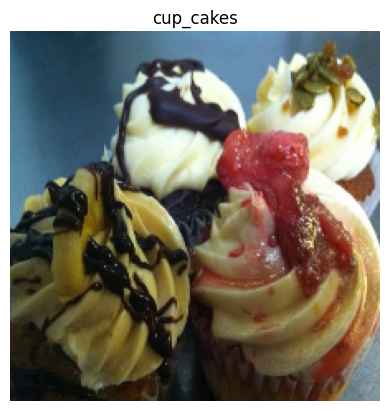

In [9]:
# Check if Food101 is available.
datasets_lists = tfds.list_builders()
print("food101" in datasets_lists)

# Load in the data.
(train_data, test_data), ds_info = tfds.load(name="food101",       
                                             split=["train", "validation"],
                                             shuffle_files=False,
                                             as_supervised=True,
                                             with_info=True)
# Get class names.
class_names = ds_info.features["label"].names
print(class_names)

# Set up parameters. 
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
TFBOARD_DIR = "tensorboard_logs/05_MilestoneProject1_FoodVisionBig"
CHECKPOINT_DIR = "checkpoints/05_MilestoneProject1_FoodVisionBig"
MODEL_DIR = "models/05_MilestoneProject1_FoodVisionBig"

# Preprocess datasets.
train_data = train_data.map(map_func=preprocess_img, 
                            num_parallel_calls=tf.data.AUTOTUNE)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)

test_data =test_data.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
test_data = test_data.batch(batch_size=BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Visualize data.
for image, label in test_data.unbatch().take(1):
  print(f"""
  Image shape: {image.shape}
  Image datatype: {image.dtype}
  Target class: {label}
  Class name: {class_names[label.numpy()]}
  Minimum value: {tf.reduce_min(image)}
  Maximum value: {tf.reduce_max(image)}
  """)

  plt.imshow(image/255.)
  plt.title(class_names[label.numpy()])
  plt.axis(False)

## Set up mixed precision training.
Allow the GPU to use float16 and float32 to speed up processing.

In [10]:
mixed_precision.set_global_policy("mixed_float16")
mixed_precision.global_policy()

<Policy "mixed_float16">

## `model_0` Feature Extraction model on EfficientNetB0 backbone.

### Create the model.

In [11]:
# Set up input shape and backbone.
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create layers.
inputs = layers.Input(shape=input_shape, name="input_layer")
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pooling")(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation(activation="softmax", name="output_layer", 
                            dtype=tf.float32)(x)

# Create model.
model_0 = tf.keras.Model(inputs, outputs, name="model_0")
model_0_MHF = MHF(img_shape=IMG_SIZE,
                 model=model_0,
                 class_names=class_names)

# Compile model.
model_0.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit the model.
history_0 = model_0.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[model_0_MHF.create_tensorboard_callback(dir_name=TFBOARD_DIR,
                                                                          experiment_name=model_0.name),
                                   model_0_MHF.create_checkpoint_callback(dir_name=CHECKPOINT_DIR,
                                                                         experiment_name=model_0.name),
                                   model_0_MHF.create_earlyStopping_callback(patience=3)])
# Get summary.
model_0.summary()

Saving TensorBoard log files to: tensorboard_logs/05_MilestoneProject1_FoodVisionBig/model_0/20230109-195909
Saving checkpoint to: checkpoints/05_MilestoneProject1_FoodVisionBig/model_0/checkpoint.ckpt


Epoch 1/5


2023-01-09 19:59:13.554731: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-01-09 19:59:14.372035: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-01-09 19:59:14.372436: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-01-09 19:59:14.372458: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2023-01-09 19:59:14.373002: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-01-09 19:59:14.373036: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


2368/2368 [==============================] - ETA: 0s - loss: 1.7173 - accuracy: 0.5814
Epoch 1: val_loss improved from inf to 1.14419, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_0/checkpoint.ckpt
2368/2368 [==============================] - 313s 129ms/step - loss: 1.7173 - accuracy: 0.5814 - val_loss: 1.1442 - val_accuracy: 0.6945
Epoch 2/5
2367/2368 [============================>.] - ETA: 0s - loss: 1.2002 - accuracy: 0.6890
Epoch 2: val_loss improved from 1.14419 to 1.03915, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_0/checkpoint.ckpt
2368/2368 [==============================] - 293s 123ms/step - loss: 1.2003 - accuracy: 0.6890 - val_loss: 1.0392 - val_accuracy: 0.7188
Epoch 3/5
2368/2368 [==============================] - ETA: 0s - loss: 1.0547 - accuracy: 0.7253
Epoch 3: val_loss improved from 1.03915 to 1.00834, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_0/checkpoint.ckpt
2368/2368 [=====================

### Evaluate model.

In [33]:
# Reload ModelHelperFunctions object.
model_0_MHF = MHF(img_shape=IMG_SIZE,
                  model=model_0,
                  class_names=class_names,
                  test_data=test_data)

790/790 [==============================] - 70s 89ms/step


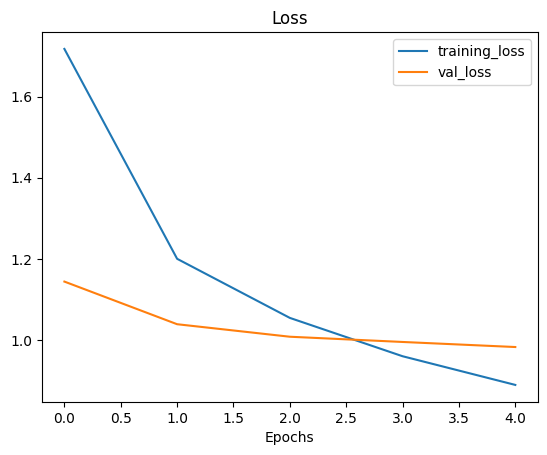

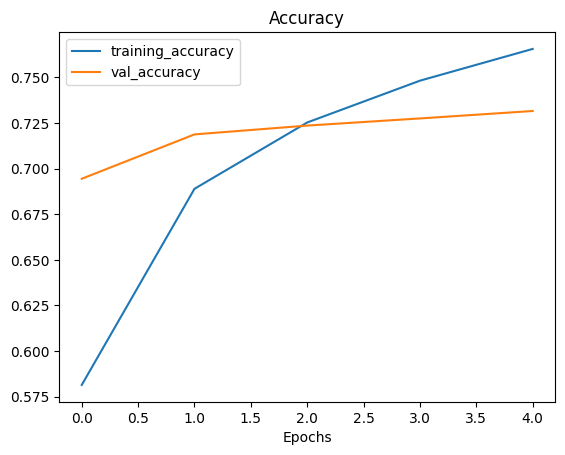

In [34]:
model_0_MHF.plot_loss_curves(history_0)

In [35]:
model_0_eval = model_0_MHF.calculate_results()
model_0_eval

,0
accuracy,73.160396
precision,0.739431
recall,0.731604
f1,0.731311


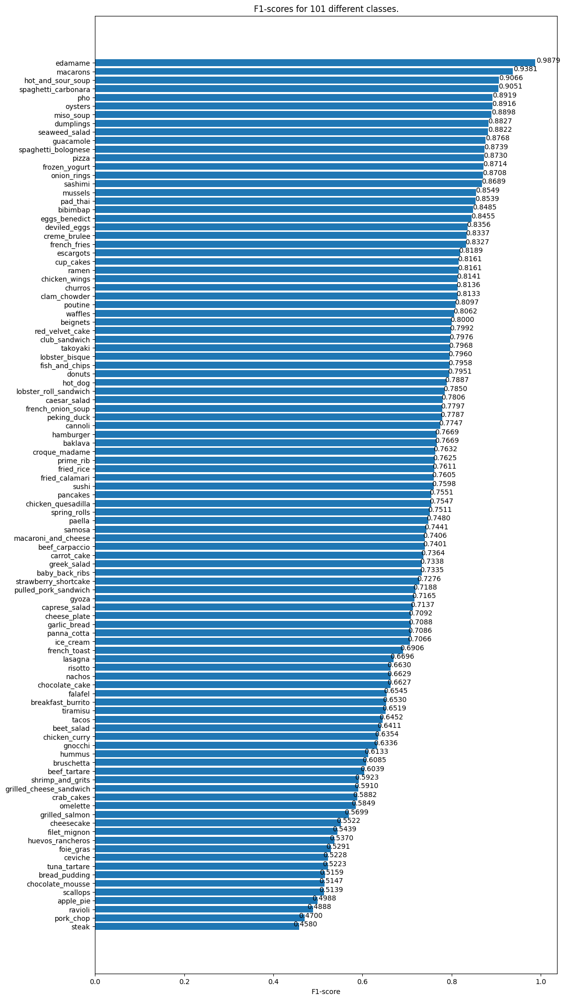

In [36]:
model_0_MHF.make_classification_report()

In [37]:
model_0_MHF.make_confusion_matrix(figsize=(100,100))

### Make predictions.

1/1 [==============================] - 1s 1s/step


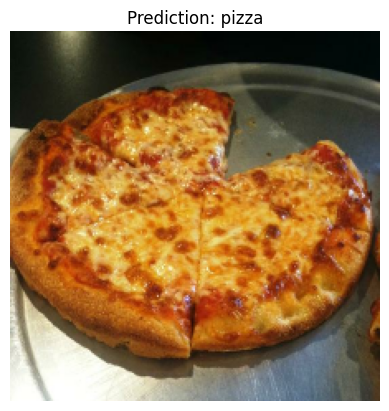

1/1 [==============================] - 0s 36ms/step


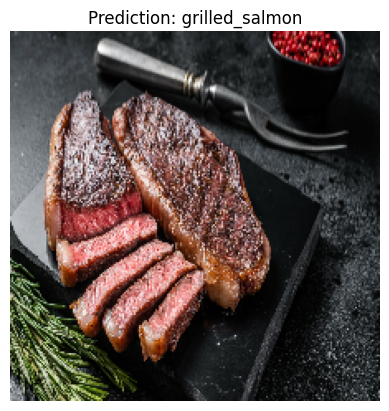

1/1 [==============================] - 0s 37ms/step


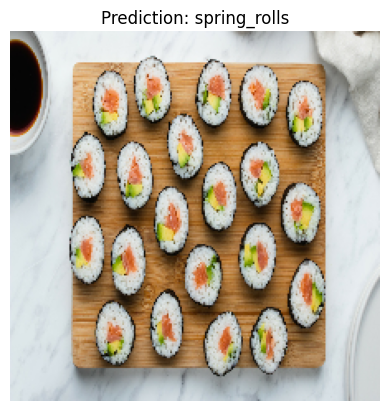

In [17]:
model_0_MHF.pred_and_plot(filename="images/pizza.jpg", scale=False)
model_0_MHF.pred_and_plot(filename="images/steak.jpg", scale=False)
model_0_MHF.pred_and_plot(filename="images/sushi.jpg", scale=False)

1/1 [==============================] - 0s 52ms/step


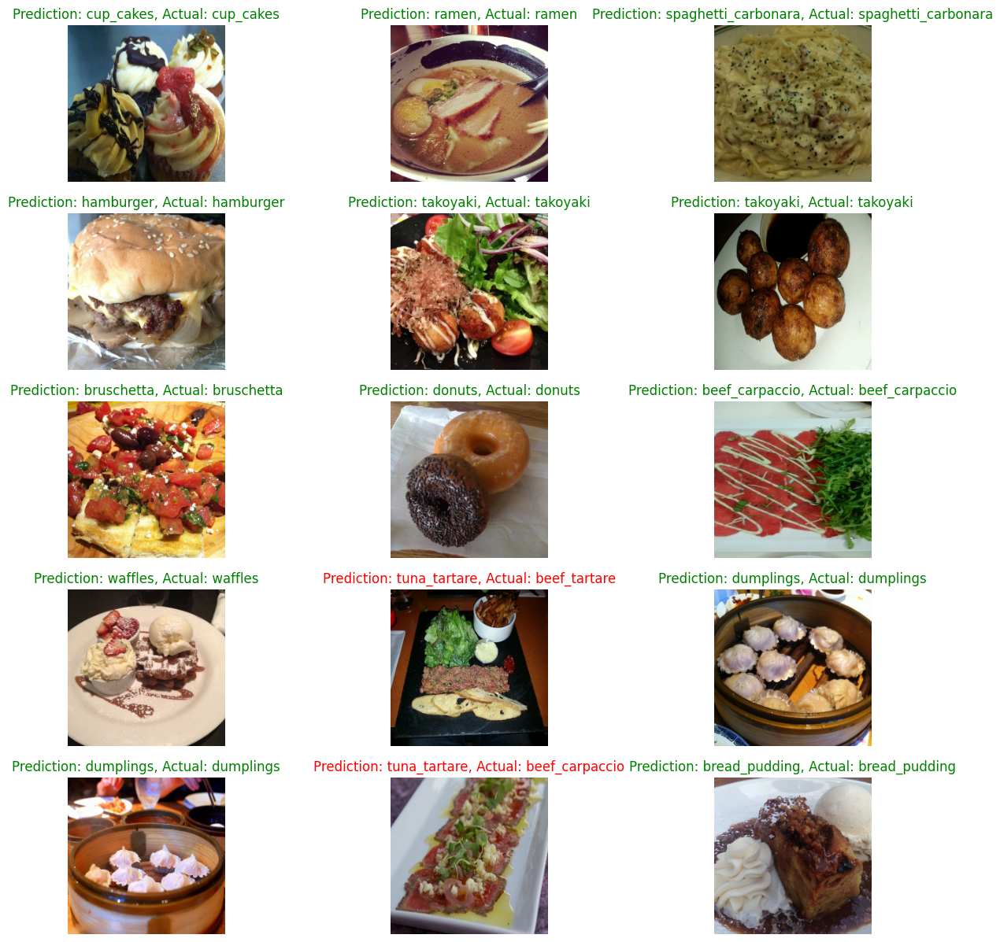

In [60]:
model_0_MHF.pred_from_batch(figsize=(15, 15),numImgs=15)

## `model_1` fine tune `model_0`

### Create model.

In [19]:
# Create model from model_0.
model_1 = tf.keras.models.clone_model(model_0)
model_1._name = "model_1"
model_1.load_weights(CHECKPOINT_DIR + "/model_0/checkpoint.ckpt")
model_1.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
model_1_MHF = MHF(img_shape=IMG_SIZE,
                  model=model_1,
                  class_names=class_names)
model_1.summary()

# Unfreeze base model layers.
base_model.trainable = True
fine_tune_at = 10
for layer in base_model.layers[:-fine_tune_at]:
  layer.trainable = False

# Compile the model.
model_1.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr=0.0001),
                metrics=["accuracy"])

# Fit the model.
initial_epochs = len(history_0.epoch)
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs

history_1 = model_1.fit(train_data,
                        epochs=total_epochs,
                        steps_per_epoch=len(train_data),
                        initial_epoch=history_0.epoch[-1],
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[model_1_MHF.create_tensorboard_callback(dir_name=TFBOARD_DIR,
                                                                           experiment_name=model_1.name),
                                   model_1_MHF.create_checkpoint_callback(dir_name=CHECKPOINT_DIR,
                                                                          experiment_name=model_1.name),
                                   model_1_MHF.create_earlyStopping_callback(patience=3)])

# Get summary.
model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pooling (GlobalA  (None, 1280)             0         
 veragePooling2D)                                                
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
 output_layer (Activation)   (None, 101)               0         
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainable params: 4,049,571
___________________________________________

/home/santiagorg2401/anaconda3/envs/tf/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 5/15
2367/2368 [============================>.] - ETA: 0s - loss: 1.0732 - accuracy: 0.7114
Epoch 5: val_loss improved from inf to 1.17365, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_1/checkpoint.ckpt
2368/2368 [==============================] - 307s 128ms/step - loss: 1.0732 - accuracy: 0.7114 - val_loss: 1.1736 - val_accuracy: 0.6850
Epoch 6/15
2367/2368 [============================>.] - ETA: 0s - loss: 1.0192 - accuracy: 0.7284
Epoch 6: val_loss improved from 1.17365 to 1.15019, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_1/checkpoint.ckpt
2368/2368 [==============================] - 302s 127ms/step - loss: 1.0192 - accuracy: 0.7284 - val_loss: 1.1502 - val_accuracy: 0.6919
Epoch 7/15
2367/2368 [============================>.] - ETA: 0s - loss: 0.9945 - accuracy: 0.7360
Epoch 7: val_loss improved from 1.15019 to 1.13685, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_1/checkpoint.ckpt
2368/2368 [========

### Evaluate model.

In [28]:
# Reload ModelHelperFunctions object.
model_1_MHF = MHF(img_shape=IMG_SIZE,
                  model=model_1,
                  class_names=class_names,
                  test_data=test_data)

790/790 [==============================] - 70s 89ms/step


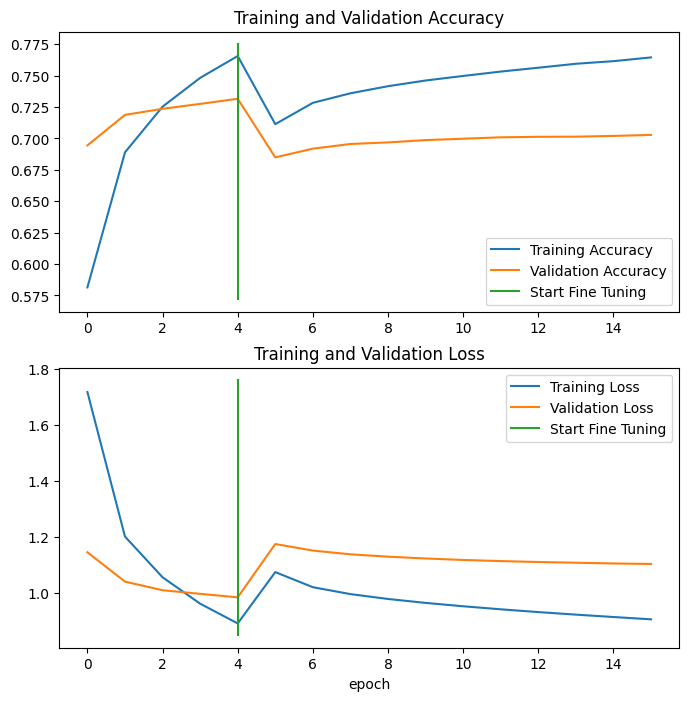

In [29]:
model_1_MHF.compare_historys(history_0, history_1)

In [39]:
model_1_eval = model_1_MHF.calculate_results()
model_1_eval

,0
accuracy,70.285149
precision,0.702367
recall,0.702851
f1,0.701435


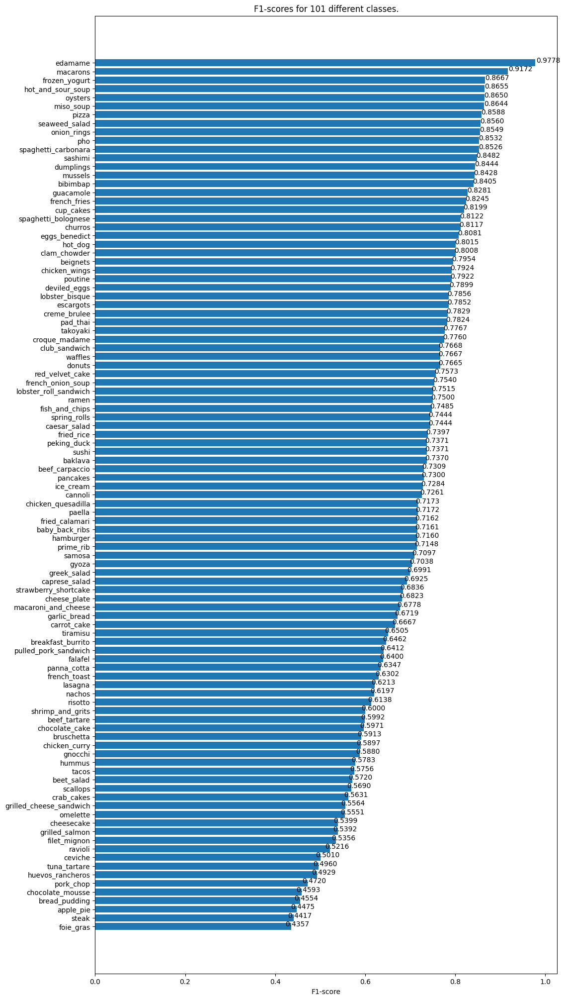

In [31]:
model_1_MHF.make_classification_report()

In [32]:
model_1_MHF.make_confusion_matrix(figsize=(100, 100))

### Make predictions.

1/1 [==============================] - 1s 892ms/step


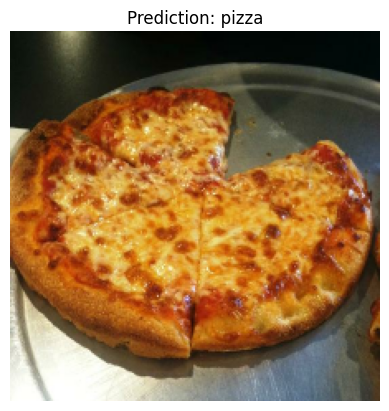

1/1 [==============================] - 0s 36ms/step


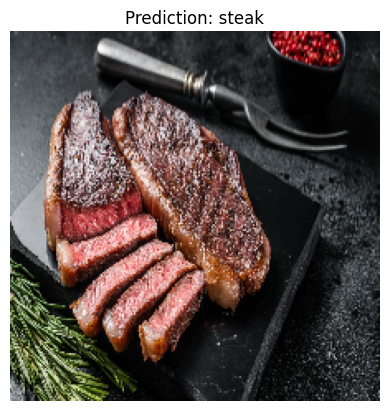

1/1 [==============================] - 0s 34ms/step


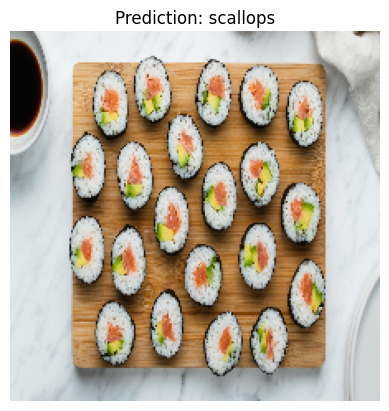

In [25]:
model_1_MHF.pred_and_plot(filename="images/pizza.jpg", scale=False)
model_1_MHF.pred_and_plot(filename="images/steak.jpg", scale=False)
model_1_MHF.pred_and_plot(filename="images/sushi.jpg", scale=False)

1/1 [==============================] - 0s 40ms/step


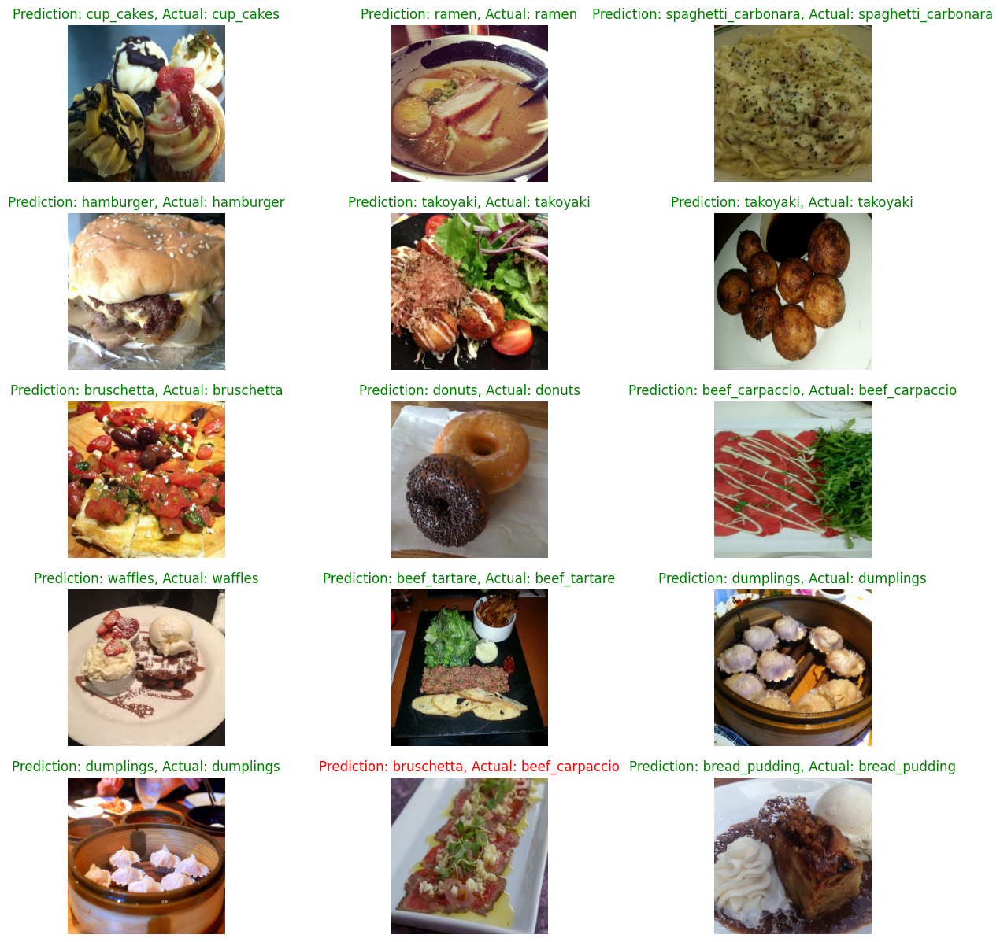

In [59]:
model_1_MHF.pred_from_batch(figsize=(15, 15),numImgs=15)

## `model_2` Fine tuning EfficientNetB7 with data augmentation.

### Data augmentation.

<Figure size 640x480 with 0 Axes>

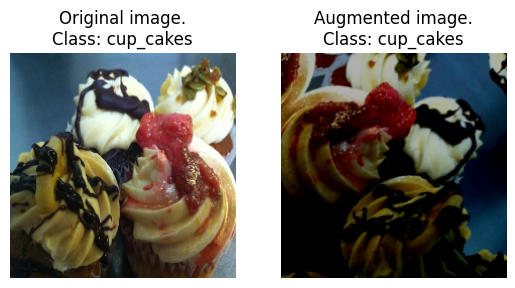

In [38]:
data_augmentation_layer = tf.keras.Sequential([
    layers.RandomBrightness(0.3),
    layers.RandomContrast(0.3),
    layers.RandomFlip(mode="horizontal"),
    layers.RandomRotation(0.25)
], name="data_augmentation_layer")

# Visualize.
plt.figure()
for image, label in test_data.unbatch().take(1):
  augmented_img = data_augmentation_layer(image, training=True)

  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.imshow(tf.cast(image, dtype=tf.float32)/255.)
  ax1.set_title(f"Original image.\nClass: {class_names[label.numpy()]}")
  ax1.axis(False)
  ax2.imshow(tf.cast(augmented_img, dtype=tf.float32)/255.)
  ax2.set_title(f"Augmented image.\nClass: {class_names[label.numpy()]}")
  ax2.axis(False)

### Create model.

In [44]:
# Set up input shape and baseline.
input_shape = IMG_SIZE + (3,)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create layers.
inputs = layers.Input(shape=input_shape, name="input_layer")
x = data_augmentation_layer(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pooling_layer")(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation(activation="softmax", name="output_layer", 
                            dtype=tf.float32)(x)

# Create model.
model_2 = tf.keras.Model(inputs, outputs, name="model_2")
model_2_MHF = MHF(img_shape=IMG_SIZE,
                  model=model_2,
                  class_names=class_names)

# Compile model.
model_2.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

# Fit model.
initial_epochs = 5
history_2 = model_2.fit(train_data,
                        epochs=initial_epochs,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data),
                        callbacks=[model_2_MHF.create_tensorboard_callback(dir_name=TFBOARD_DIR,
                                                                           experiment_name=model_2.name),
                                   model_2_MHF.create_checkpoint_callback(dir_name=CHECKPOINT_DIR,
                                                                          experiment_name=model_2.name),
                                   model_2_MHF.create_earlyStopping_callback(patience=3)])

# Get summary.
model_2.summary()

# Freeze all layers except for last 10.
fine_tune_at = 10
base_model.trainable = True
for layer in base_model.layers[:-fine_tune_at]:
  layer.trainable = False

# Compile the model.
model_2.compile(loss="sparse_categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(lr=0.0001),
                metrics=["accuracy"])

# Fit the model.
fine_tune_epochs = 10
total_epochs = initial_epochs + fine_tune_epochs
history_2_fine = model_2.fit(train_data,
                             epochs=total_epochs,
                             steps_per_epoch=len(train_data),
                             validation_data=test_data,
                             validation_steps=len(test_data),
                             initial_epoch=history_2.epoch[-1],
                             callbacks=[model_2_MHF.create_tensorboard_callback(dir_name=TFBOARD_DIR,
                                                                       experiment_name=model_2.name+"_fine"),
                                        model_2_MHF.create_checkpoint_callback(dir_name=CHECKPOINT_DIR,
                                                                      experiment_name=model_2.name+"_fine"),
                                        model_2_MHF.create_earlyStopping_callback(patience=3)])

# Get summary.
model_2.summary()

Saving TensorBoard log files to: tensorboard_logs/05_MilestoneProject1_FoodVisionBig/model_2/20230109-222829
Saving checkpoint to: checkpoints/05_MilestoneProject1_FoodVisionBig/model_2/checkpoint.ckpt


Epoch 1/5


2367/2368 [============================>.] - ETA: 0s - loss: 2.0893 - accuracy: 0.4968WARNING:tensorflow:Model was constructed with shape (224, 224, 3) for input KerasTensor(type_spec=TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name='random_brightness_input'), name='random_brightness_input', description="created by layer 'random_brightness_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).



Epoch 1: val_loss improved from inf to 1.26267, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2/checkpoint.ckpt
2368/2368 [==============================] - 511s 213ms/step - loss: 2.0893 - accuracy: 0.4968 - val_loss: 1.2627 - val_accuracy: 0.6603
Epoch 2/5
2367/2368 [============================>.] - ETA: 0s - loss: 1.6103 - accuracy: 0.5899
Epoch 2: val_loss improved from 1.26267 to 1.14424, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2/checkpoint.ckpt
2368/2368 [==============================] - 504s 213ms/step - loss: 1.6102 - accuracy: 0.5899 - val_loss: 1.1442 - val_accuracy: 0.6909
Epoch 3/5
2367/2368 [============================>.] - ETA: 0s - loss: 1.4900 - accuracy: 0.6173
Epoch 3: val_loss improved from 1.14424 to 1.09196, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2/checkpoint.ckpt
2368/2368 [==============================] - 504s 213ms/step - loss: 1.4901 - accuracy: 0.6173 - val_loss: 1.0920 - va

Epoch 5/15


2368/2368 [==============================] - ETA: 0s - loss: 1.2318 - accuracy: 0.6755WARNING:tensorflow:Model was constructed with shape (224, 224, 3) for input KerasTensor(type_spec=TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name='random_brightness_input'), name='random_brightness_input', description="created by layer 'random_brightness_input'"), but it was called on an input with incompatible shape (None, 224, 224, 3).



Epoch 5: val_loss improved from inf to 0.96448, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2_fine/checkpoint.ckpt
2368/2368 [==============================] - 513s 214ms/step - loss: 1.2318 - accuracy: 0.6755 - val_loss: 0.9645 - val_accuracy: 0.7330
Epoch 6/15
2367/2368 [============================>.] - ETA: 0s - loss: 1.1308 - accuracy: 0.6990
Epoch 6: val_loss improved from 0.96448 to 0.93934, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2_fine/checkpoint.ckpt
2368/2368 [==============================] - 506s 214ms/step - loss: 1.1308 - accuracy: 0.6990 - val_loss: 0.9393 - val_accuracy: 0.7402
Epoch 7/15
2367/2368 [============================>.] - ETA: 0s - loss: 1.0605 - accuracy: 0.7159
Epoch 7: val_loss improved from 0.93934 to 0.92479, saving model to checkpoints/05_MilestoneProject1_FoodVisionBig/model_2_fine/checkpoint.ckpt
2368/2368 [==============================] - 506s 213ms/step - loss: 1.0605 - accuracy: 0.7159 - val_

### Evaluate model.

In [48]:
# Reload ModelHelperFunctions object.
model_2_MHF = MHF(img_shape=IMG_SIZE,
                  model=model_2,
                  class_names=class_names,
                  test_data=test_data)

790/790 [==============================] - 71s 89ms/step


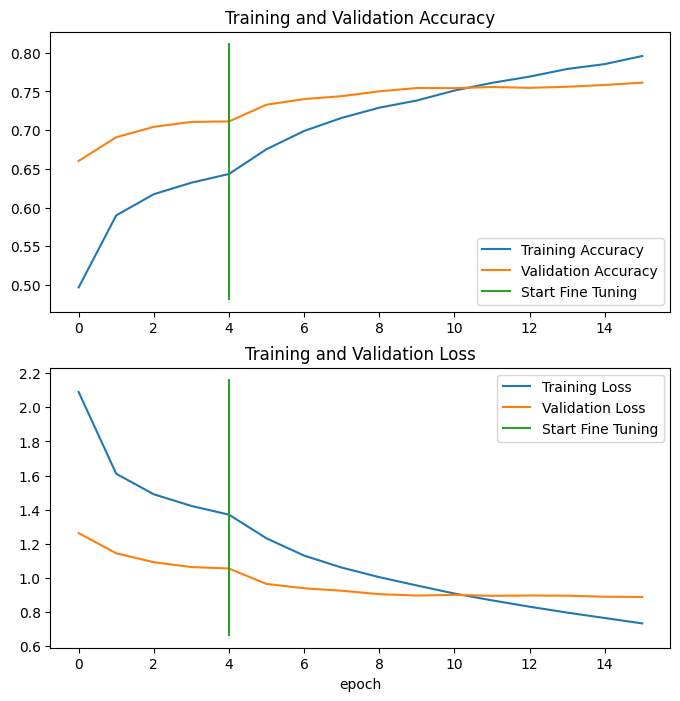

In [49]:
model_2_MHF.compare_historys(history_2, history_2_fine)

In [51]:
model_2_eval = model_2_MHF.calculate_results()
model_2_eval

,0
accuracy,76.138614
precision,0.764059
recall,0.761386
f1,0.760584


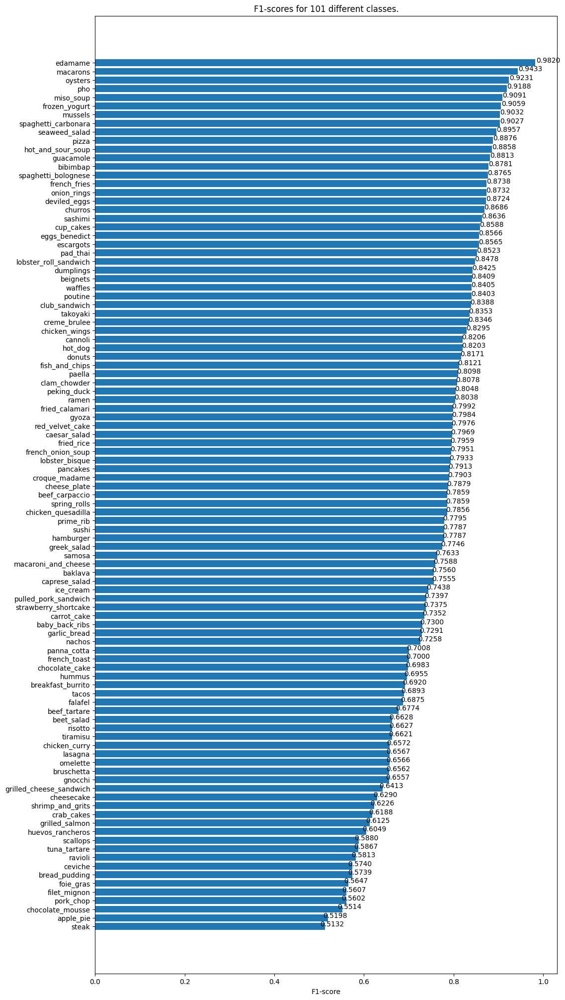

In [52]:
model_2_MHF.make_classification_report()

In [54]:
model_2_MHF.make_confusion_matrix(figsize=(100,100))

### Make predictions.

1/1 [==============================] - 2s 2s/step


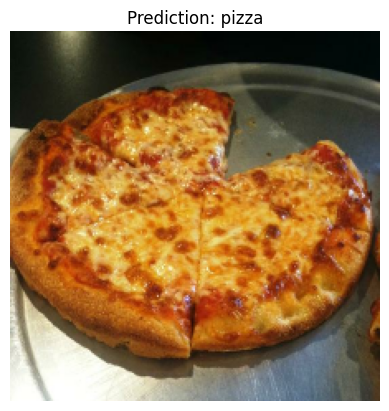

1/1 [==============================] - 0s 37ms/step


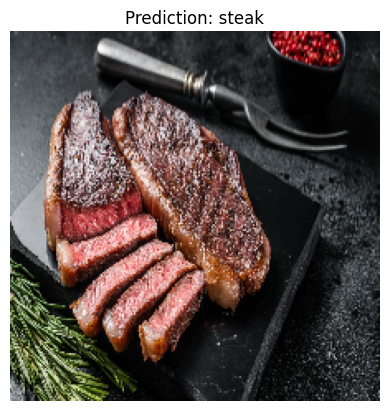

1/1 [==============================] - 0s 33ms/step


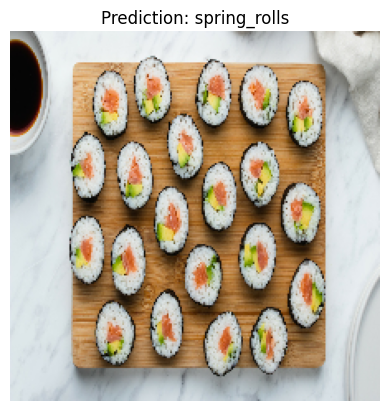

In [55]:
model_2_MHF.pred_and_plot(filename="images/pizza.jpg", scale=False)
model_2_MHF.pred_and_plot(filename="images/steak.jpg", scale=False)
model_2_MHF.pred_and_plot(filename="images/sushi.jpg", scale=False)

1/1 [==============================] - 0s 38ms/step


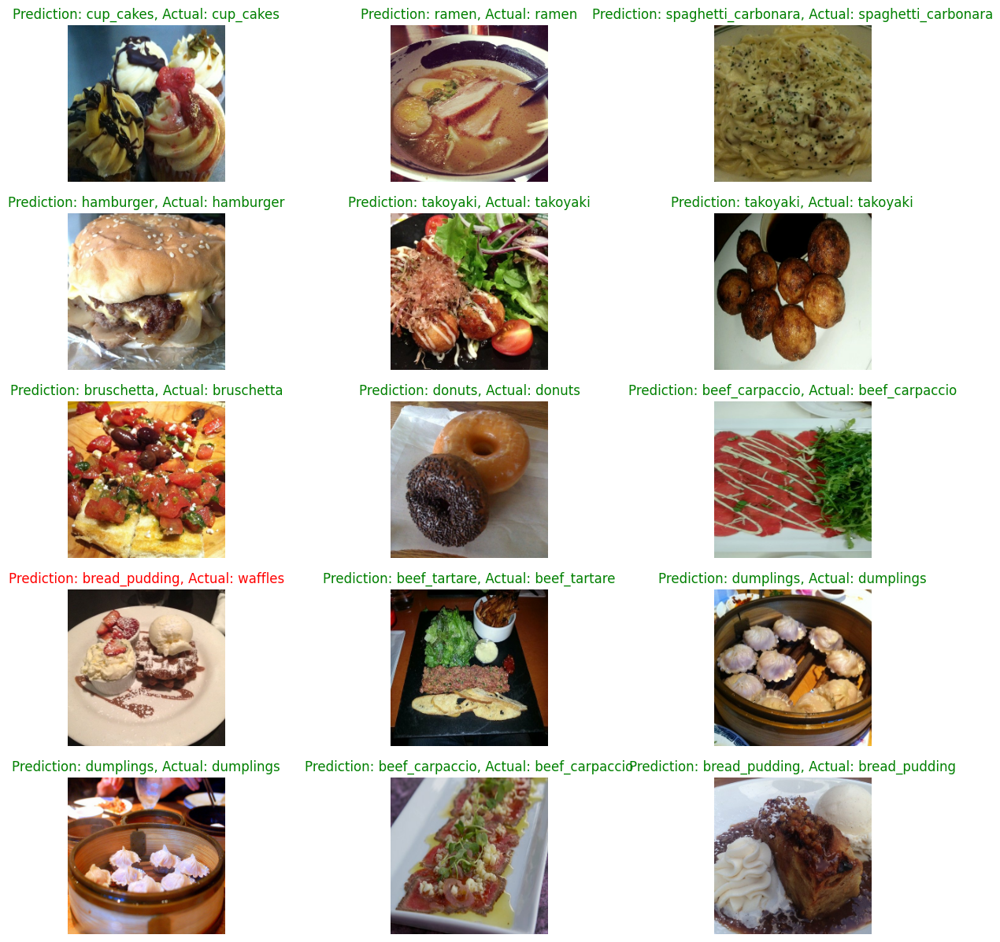

In [58]:
model_2_MHF.pred_from_batch(figsize=(15, 15),numImgs=15)

## Results.

In [72]:
pd.concat([model_0_eval.transpose(), model_1_eval.transpose(), model_2_eval.transpose()], ignore_index=True)

,accuracy,precision,recall,f1
0,73.160396,0.739431,0.731604,0.731311
1,70.285149,0.702367,0.702851,0.701435
2,76.138614,0.764059,0.761386,0.760584


### Upload results on TensorBoard.

In [ ]:
!tensorboard dev upload --logdir tensorboard_logs/05_MilestoneProject1_FoodVisionBig \
  --name "Fine-tuning EfficientNetB0 on all Food101 Data" \
  --description "3 Trials with EfficientNetB0 on Food101." \
  --one_shot

https://tensorboard.dev/experiment/xV9rR7UnQWmzK68Eb0goIg/